# Exploración de datos - Estación de Quintero

In [2]:
%load_ext autoreload
%autoreload 2

import sys
import os

project_path = os.path.abspath('../')
sys.path.insert(1, project_path)

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="darkgrid")
sns.set_context('talk')

from src.utils import get_project_root
from src.data.make_dataset import get_minma_data
from src.eda.processing import get_SO2_peaks, get_SO2_limit, filter_by_dates, dates_to_hours, to_season, daily_stats, df_counts
from src.eda.visualization import hist_plot, conf_matrix, lag_plot, plot_peak_counts,\
                                    plot_temp, cumdistr_comparison, cumdistr_comparacion_horaria
from src.eda.trends import *
import dataframe_image as dfi

## Carga de datos 

### Datos

In [3]:
data_df = pd.read_excel(get_project_root() / 'data' / 'raw' / 'CEMS industrial datos Quintero.xlsx', header=2).set_index('date')

## Conteo de datos

In [6]:
# print(f'Rango de datos desde {data_df.index[0]} hasta {data_df.index[-1]}')
# print(df_counts(data_df).to_markdown())

Rango de datos desde 2019-08-01 01:00:00 hasta 2022-09-28 15:00:00

|                           |   N° datos |   N° datos nulos |   N° datos esperados |   Datos respecto al esperado [%] | Tipo de datos   |
|:--------------------------|-----------:|-----------------:|---------------------:|---------------------------------:|:----------------|
| CEMS U1 Ventanas          |      12388 |            15323 |                27711 |                            44.7  | float64         |
| CEMS U2 Ventanas          |      16786 |            10925 |                27711 |                            60.58 | float64         |
| CEMS U3 Ventanas          |      18760 |             8951 |                27711 |                            67.7  | float64         |
| CEMS U4 Ventanas          |      19586 |             8125 |                27711 |                            70.68 | float64         |
| CEMS Chimenea Codelco     |      15021 |            12690 |                27711 |                            54.21 | float64         |
| CEMS Planta Acido Codelco |      19703 |             8008 |                27711 |                            71.1  | float64         |

## Visualización inicial

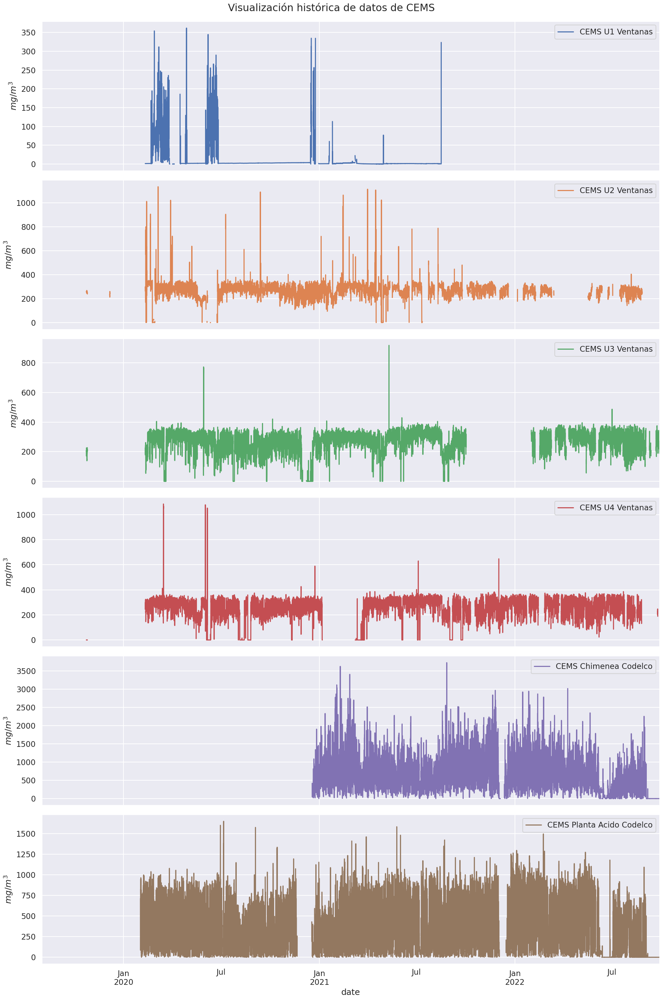

In [8]:
data_df.plot(figsize=(20,30), subplots=True, ylabel=r'$mg/m^3$')
plt.suptitle('Visualización histórica de datos de CEMS', y=0.99)
plt.tight_layout()
plt.show()

## Estadísticas

### Histogramas

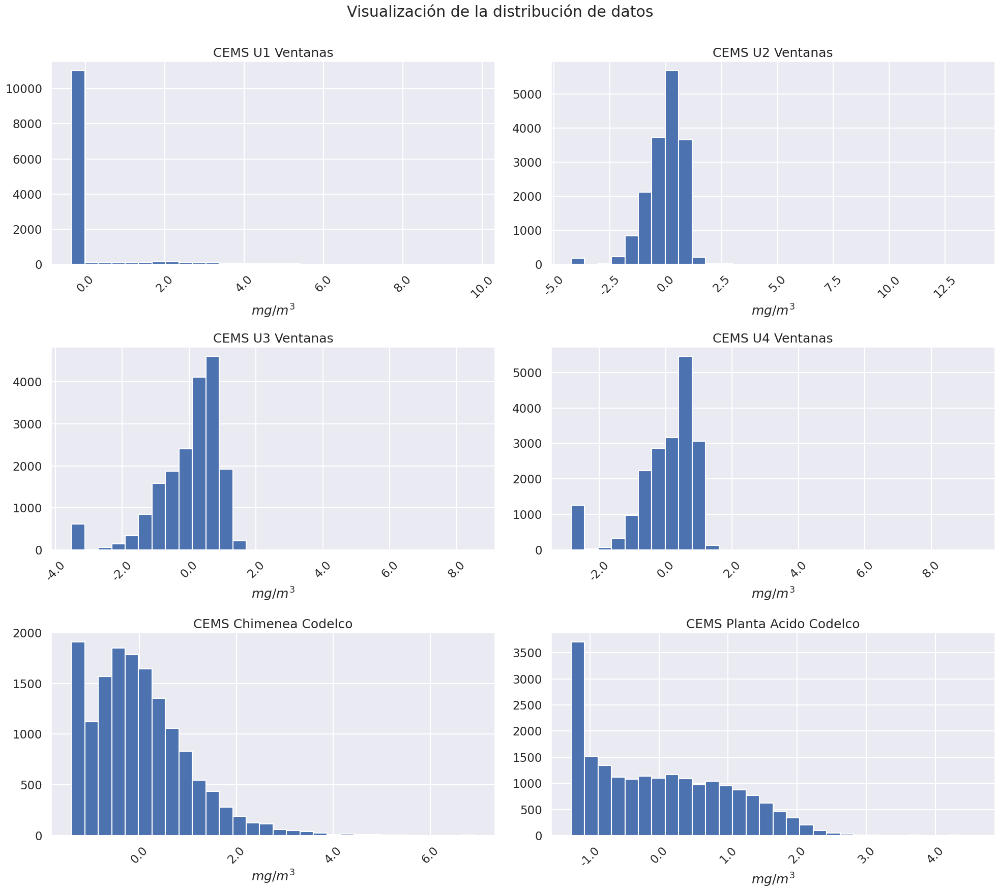

In [10]:
# args = {'xscale':'log', 'yscale':'log'} # -> Descomentar para aplica escala logaritmica
# xlabel_list = [str(a) + b for a,b in zip(data_df.columns.tolist(),[' [ppm/hr]']*data_df.shape[1])]
data_df_norm = (data_df - data_df.mean()) / data_df.std()
hist_plot(data_df_norm, xlabel_list=[r'$mg/m^3$']*data_df.shape[1]) #, **args) -> Opcional para escala logaritmica, u otros parámetros

### Resumen estadístico

In [11]:
data_df.describe()

,CEMS U1 Ventanas,CEMS U2 Ventanas,CEMS U3 Ventanas,CEMS U4 Ventanas,CEMS Chimenea Codelco,CEMS Planta Acido Codelco
count,12388.000000,16786.000000,18760.000000,19586.000000,15021.000000,19703.000000
mean,12.553066,266.664728,267.960240,254.333037,628.224463,359.028793
std,35.598075,62.860692,76.038918,89.209258,447.889732,282.253395
min,0.025691,0.072111,0.000000,0.000000,0.000000,0.000000
25%,1.071545,237.723750,231.588250,216.972250,310.120000,97.883150
50%,1.971170,274.011500,287.927500,279.314500,568.606000,327.583000
75%,3.053872,301.451000,318.527500,315.101500,874.874000,579.797000
max,361.922000,1136.140000,917.834000,1084.550000,3727.310000,1648.650000


## Correlaciones entre datos

### Pair plot

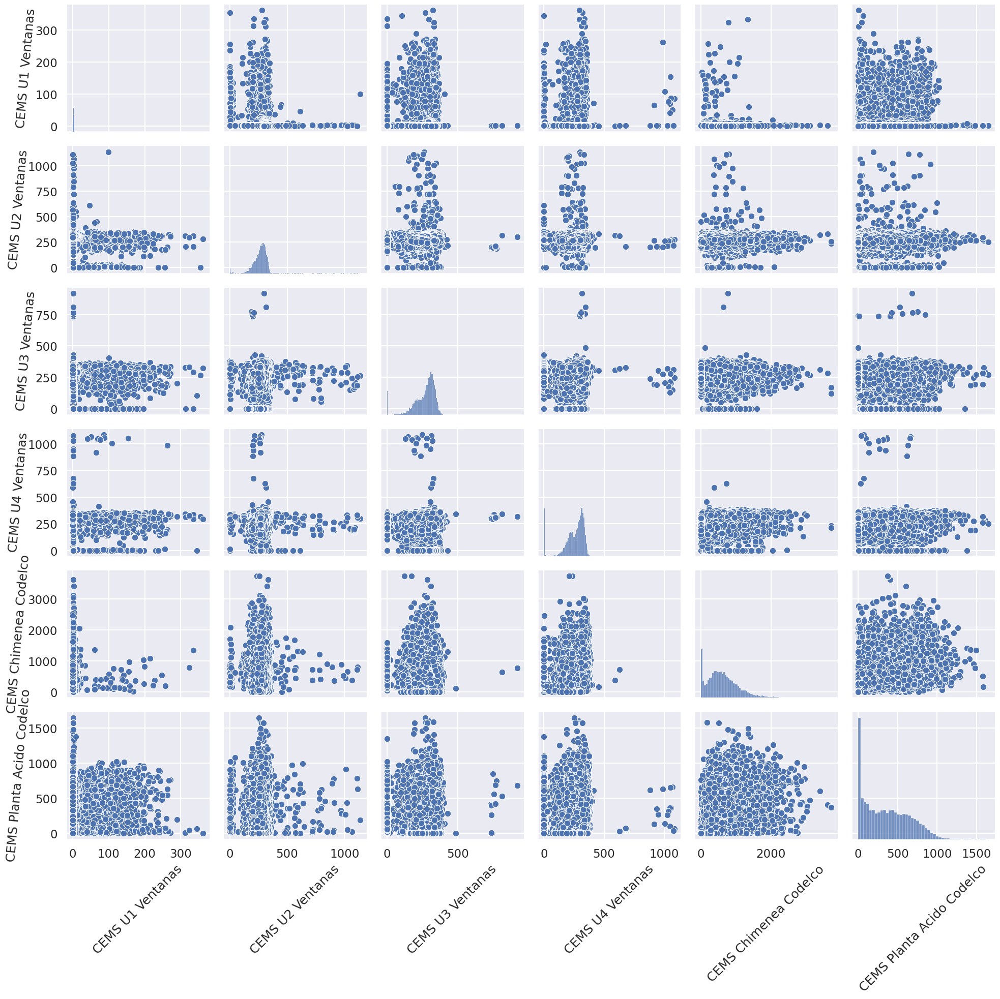

In [29]:
g = sns.pairplot(data_df)
g.fig.set_size_inches(20, 20)
for ax in g.axes.flatten():
    # rotate x axis labels
    ax.set_xlabel(ax.get_xlabel(), rotation = 45)
    # rotate y axis labels
    ax.set_ylabel(ax.get_ylabel(), rotation = 85)
    # set y labels alignment
plt.tight_layout()
plt.show()

### Matriz de confusion

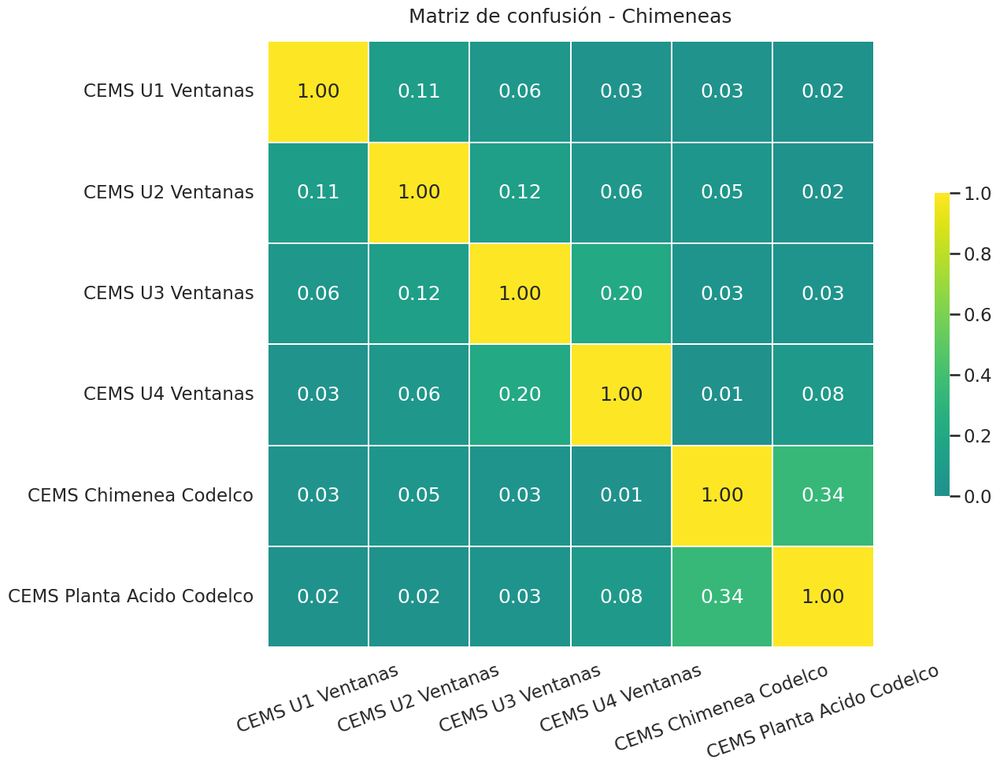

In [35]:
fig, ax = plt.subplots(figsize=(20,10))

conf_matrix(data_df)
ax.set_title('Matriz de confusión - Chimeneas', y=1.02)
ax.xaxis.set_ticklabels(ax.get_xticklabels(), rotation=20)
plt.show()

## Lag plots

### 1 hora

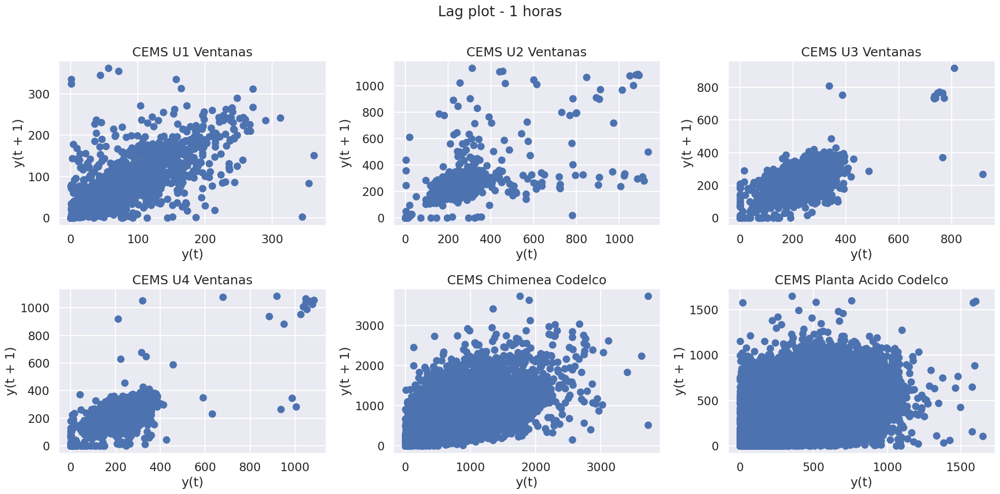

In [36]:
lag_plot(data_df, lag=1, unit='horas')

### 1 día

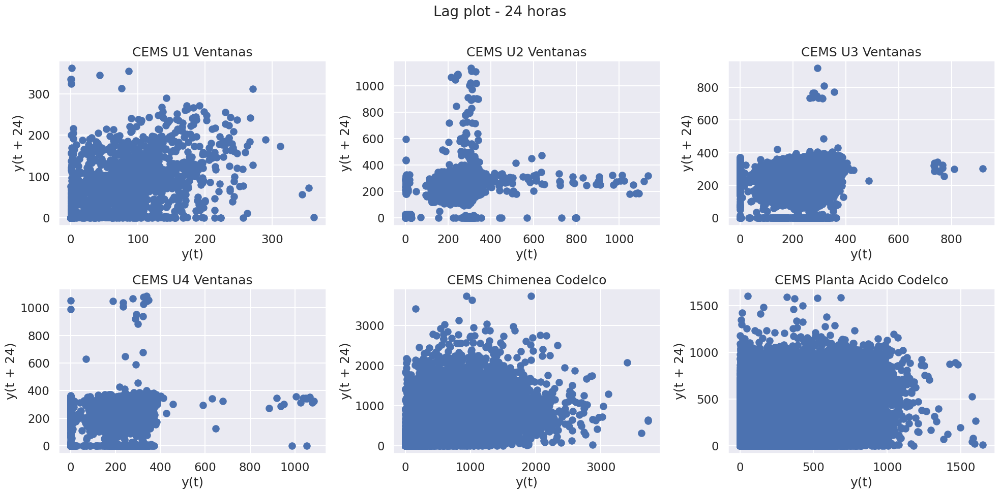

In [37]:
lag_plot(data_df, lag=24, unit='horas')

## Tendencias

CEMS U1 Ventanas------------------------------------------------------------------------------------------------------------------------------------------------------


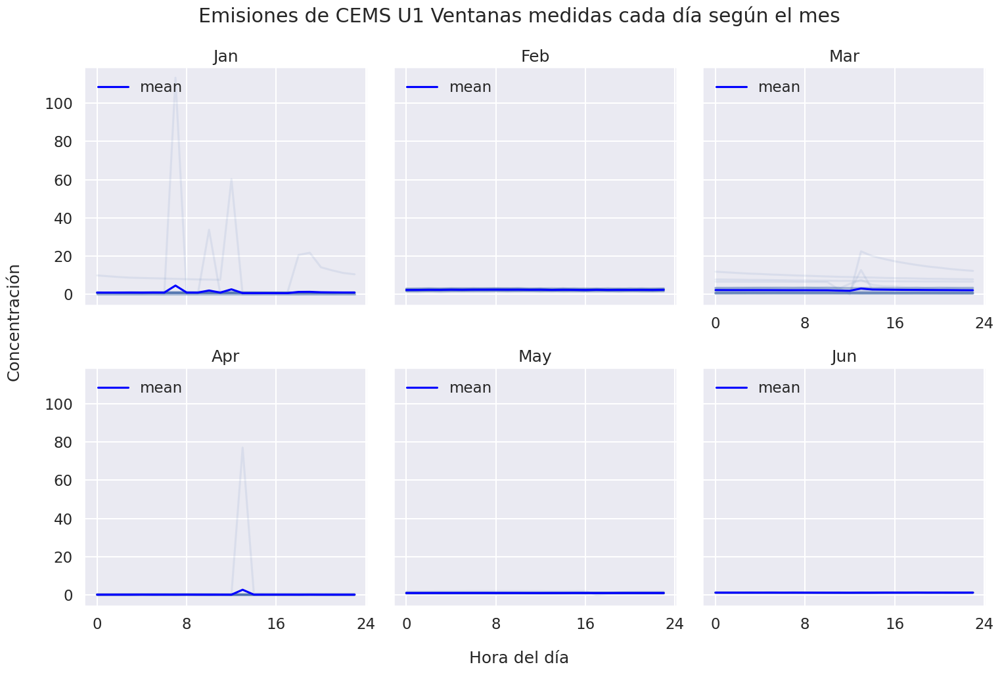

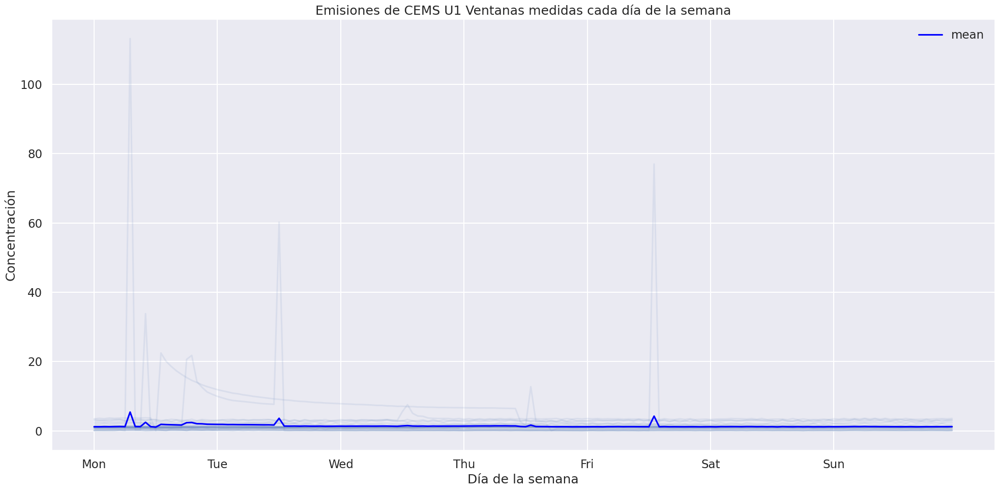

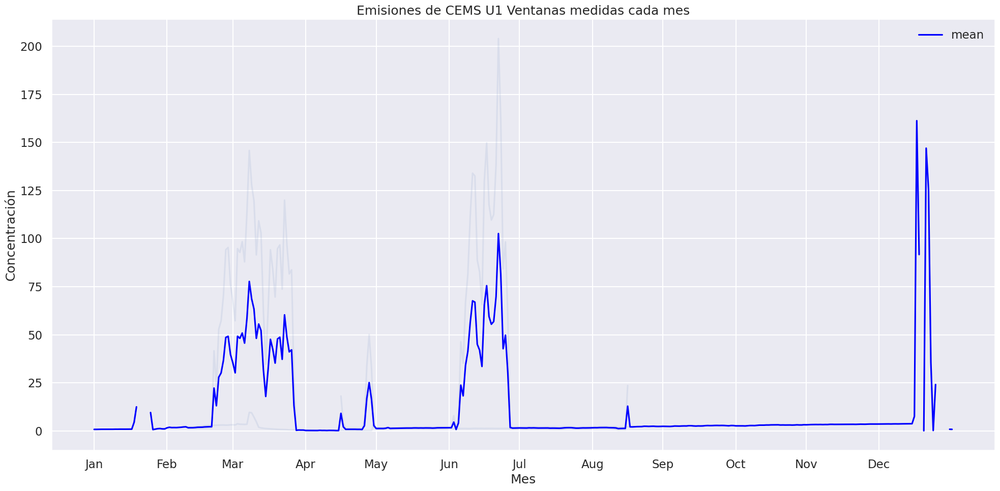

CEMS U2 Ventanas------------------------------------------------------------------------------------------------------------------------------------------------------


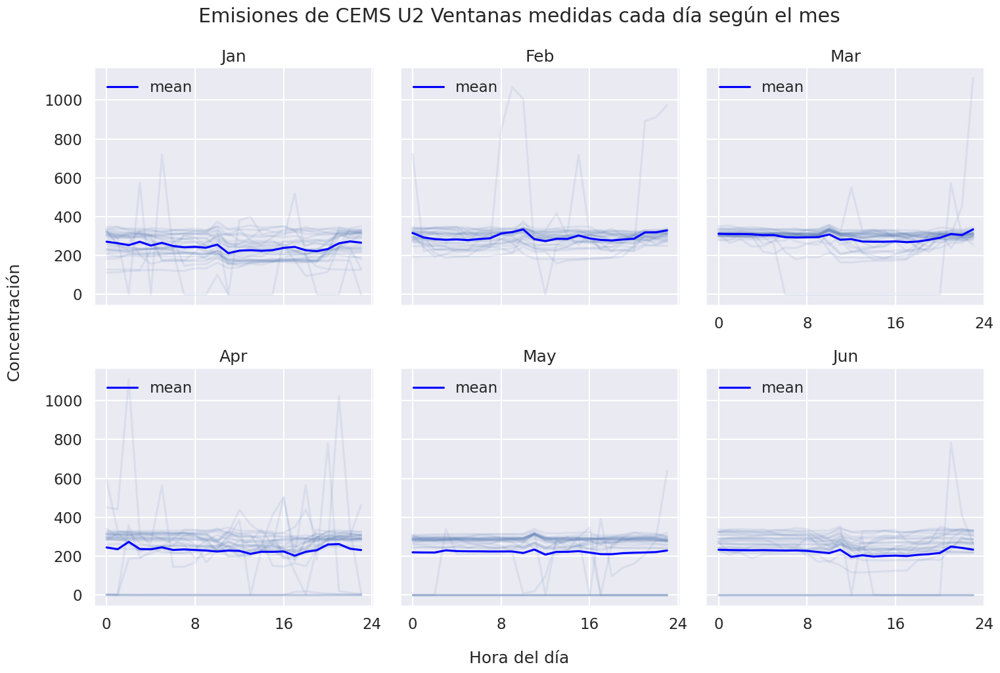

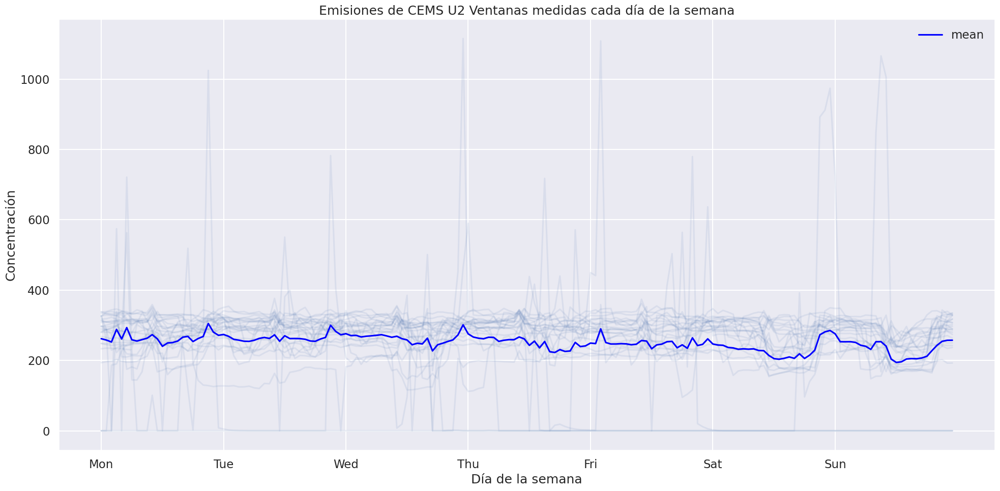

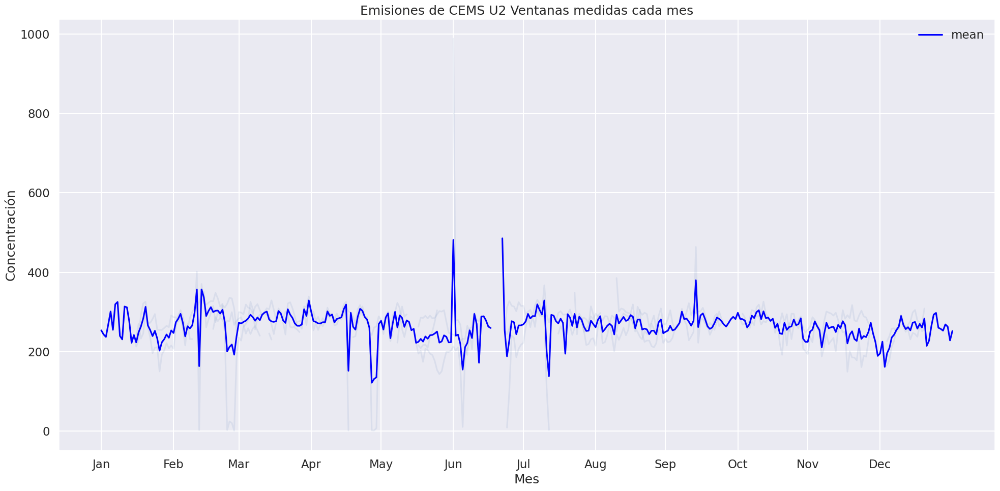

CEMS U3 Ventanas------------------------------------------------------------------------------------------------------------------------------------------------------


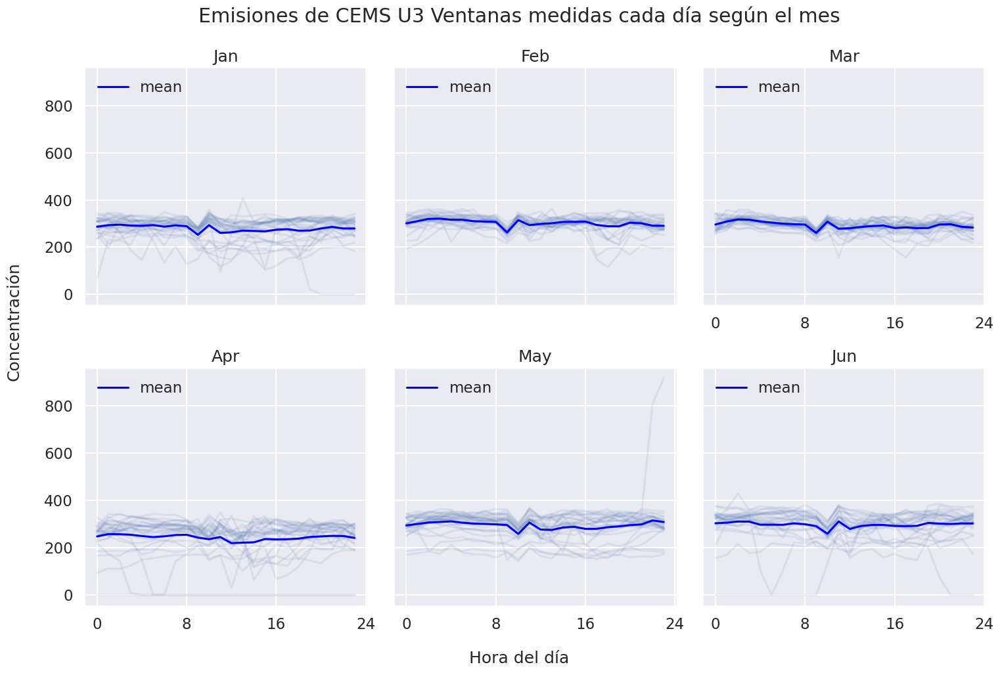

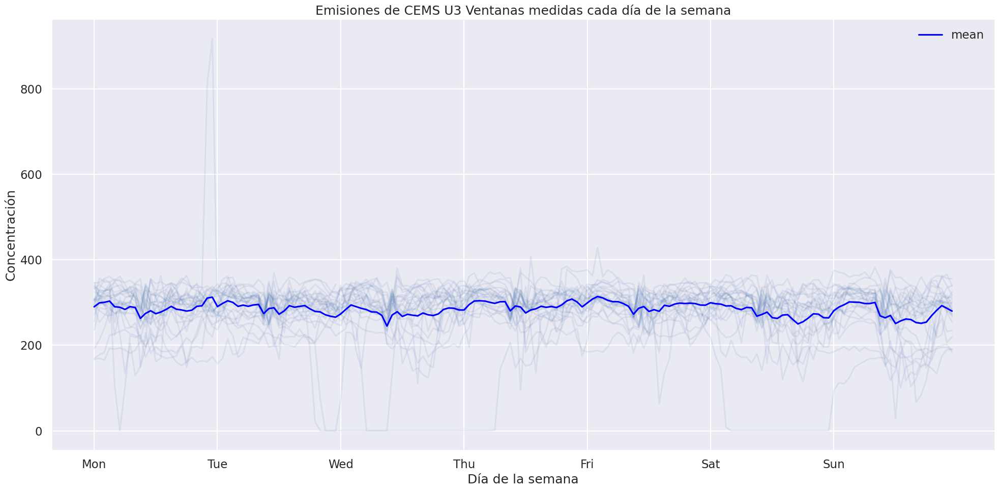

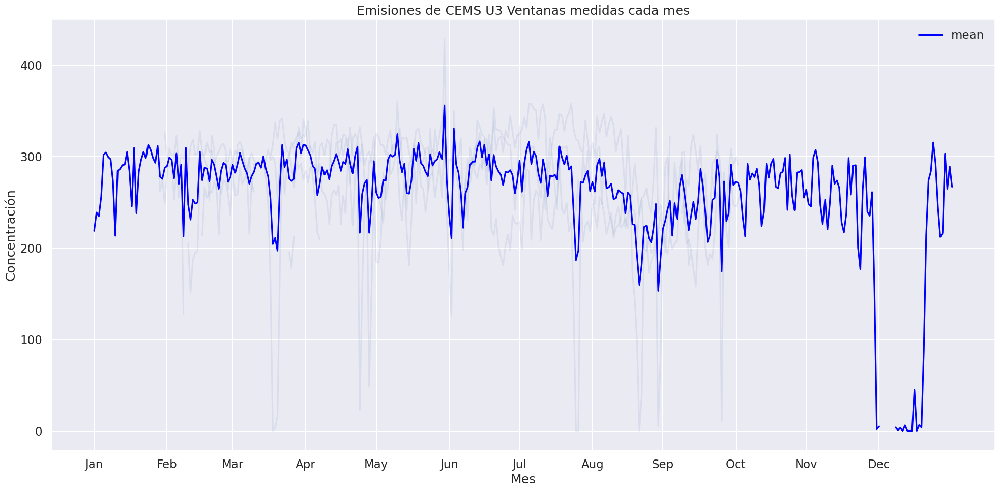

CEMS U4 Ventanas------------------------------------------------------------------------------------------------------------------------------------------------------


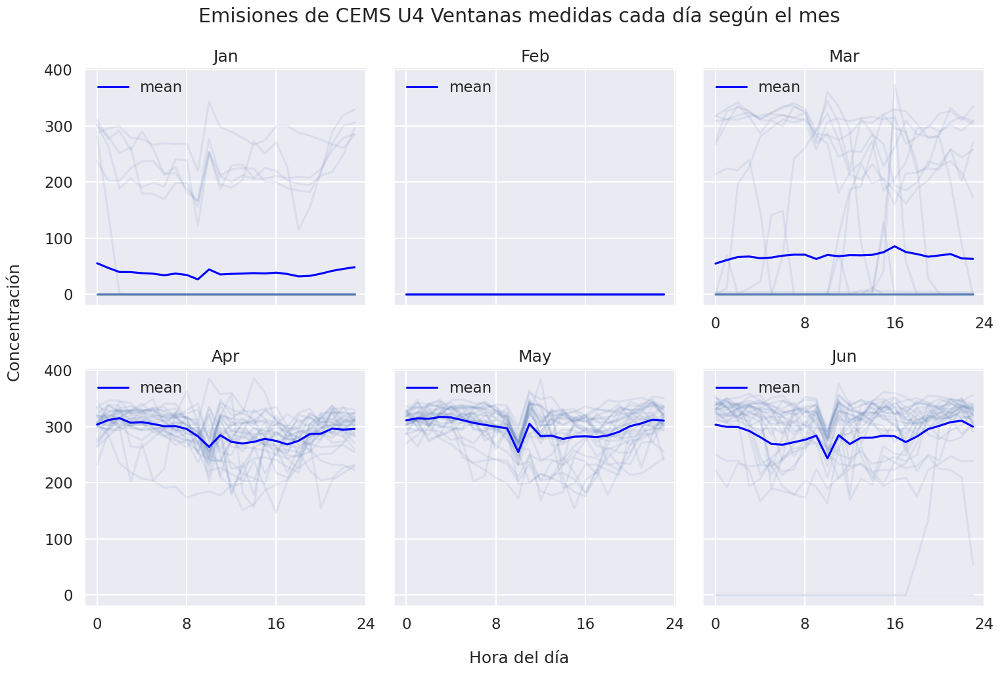

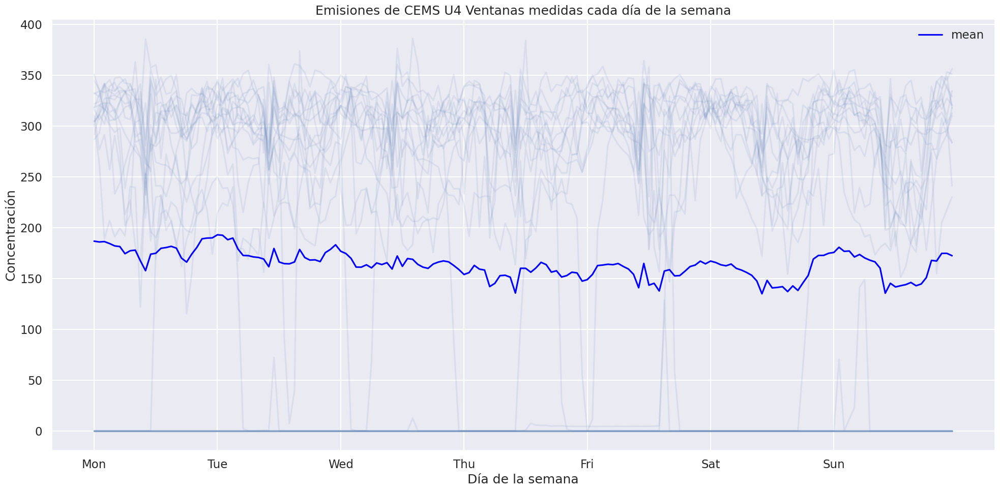

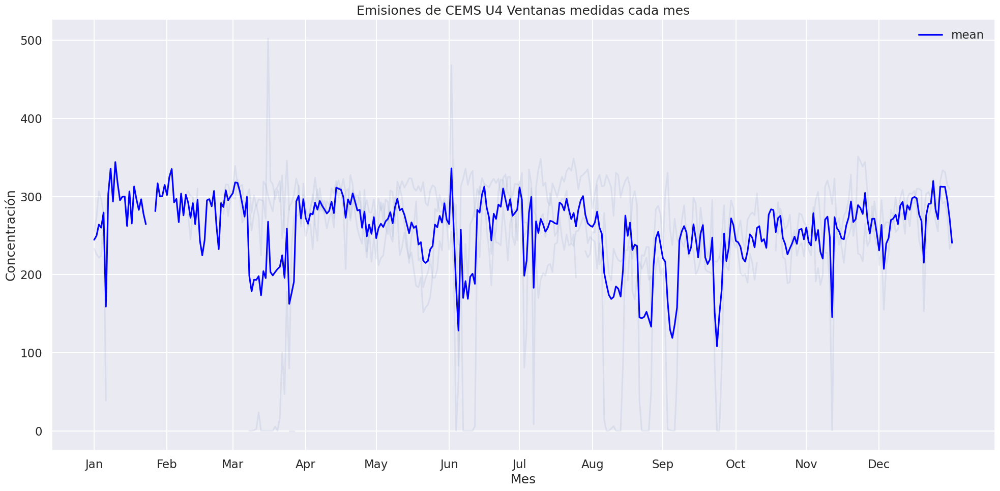

CEMS Chimenea Codelco------------------------------------------------------------------------------------------------------------------------------------------------------


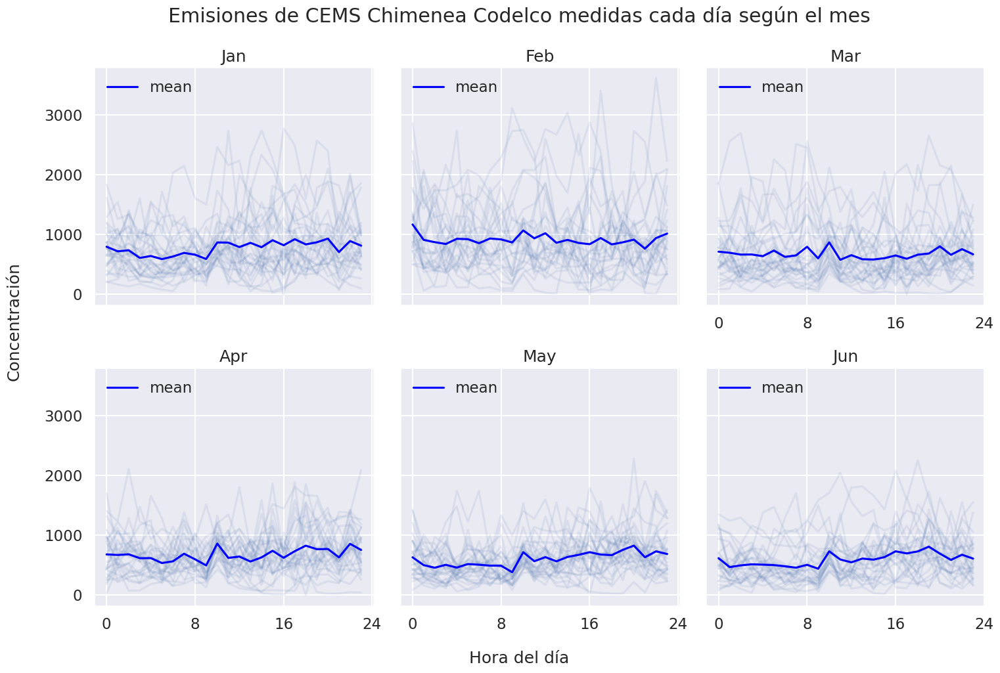

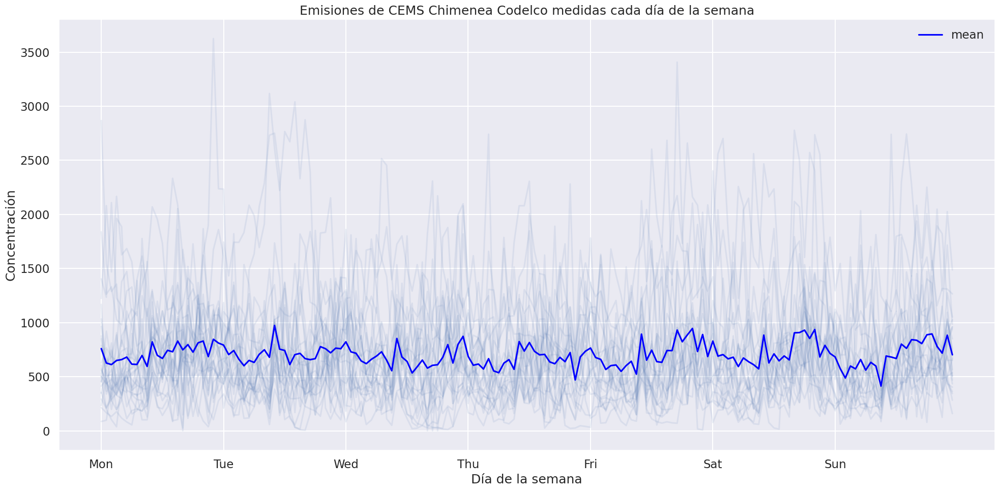

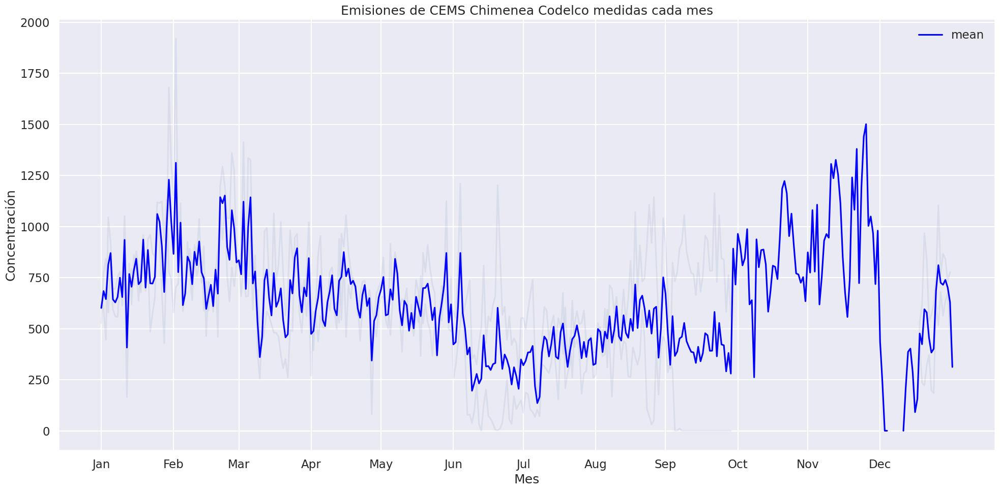

CEMS Planta Acido Codelco------------------------------------------------------------------------------------------------------------------------------------------------------


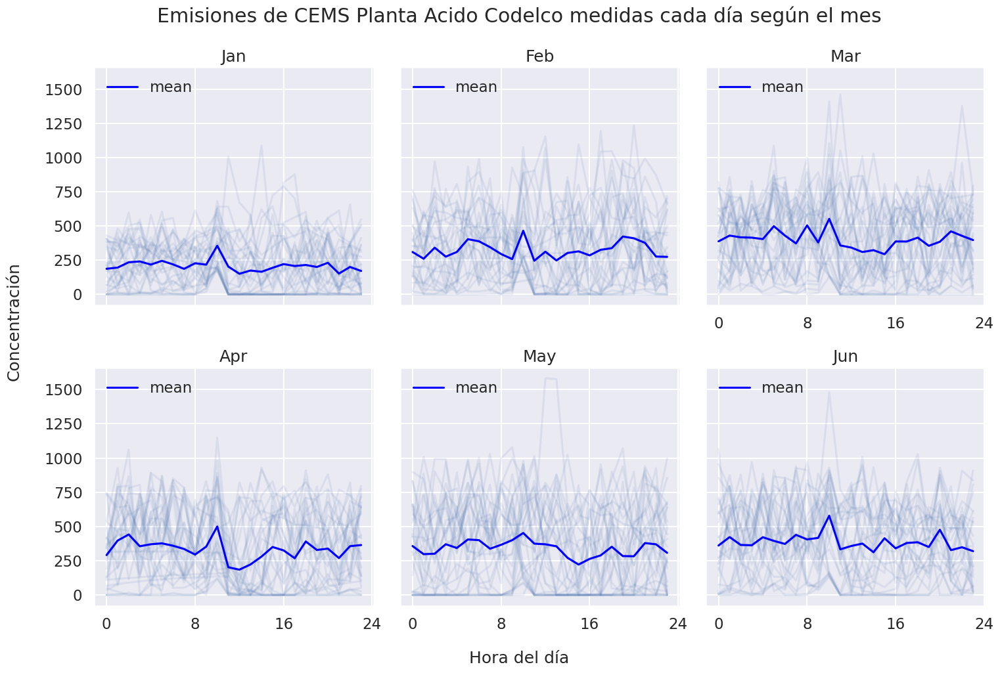

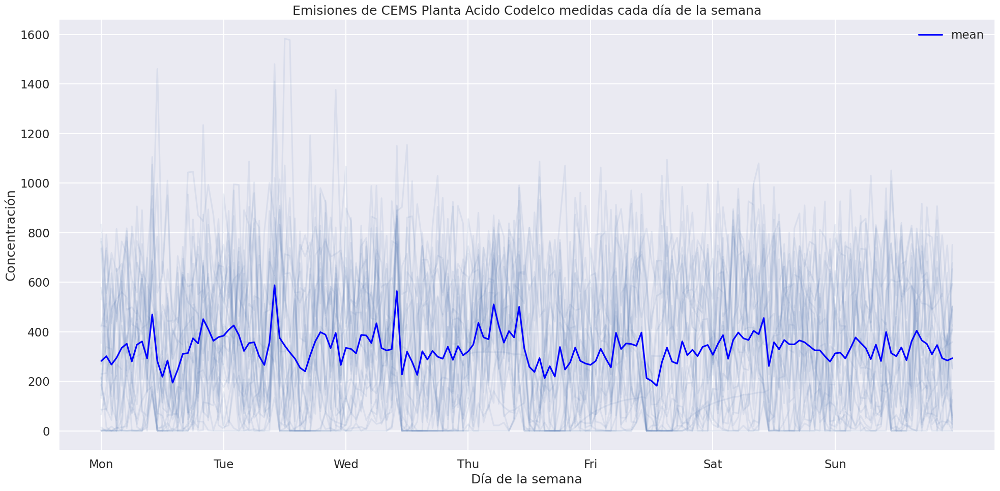

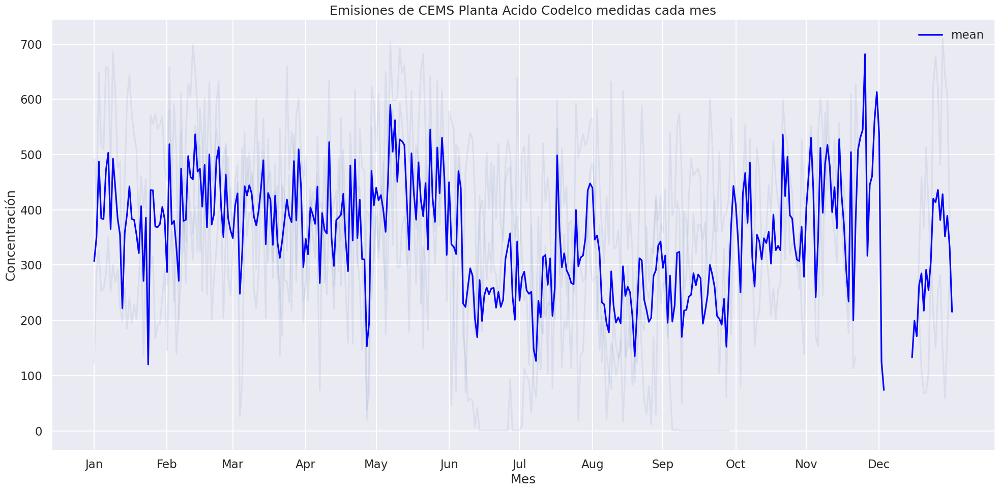

In [42]:
for col in data_df.columns:
    print(col + '-'*150)
    visualizar_trends(data_df, col = col, ano_0=2021, title=f'Emisiones de {col}')